# **Customer Segmentation Notebook**

### In this notebook we will establish a baseline foundation for our customers, scaling our data as well as using PCA to reduce dimensionality.  We will also create custom features and use several Clustering models to extract unique clusters of customer groups based on the features input to the model.  We will then observe the characteristics of each cluster and give each identities that we will use in the rest of our project.

In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors



#### Let's begin again by bringing in our main dataframe and taking a quick look.

In [2]:
df_mod = pd.read_csv(f'/Users/ryanm/Desktop/df-mod.csv')
df_mod = df_mod.drop(columns = ['product_name', 'aisle', 'department'])
print(df_mod.shape)
df_mod.head(5)

(3214874, 16)


,user_id,order_number,order_id,order_dow,order_hour_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,aisle_id,department_id,product_name_code,aisle_code,department_code,avg_orders,order_dow_name
0,1,1,2539329,3,9,12.0,26405,5,0,54,17,31683,99,11,23488,Wednesday
1,1,2,2398795,4,8,16.0,26088,6,1,23,19,980,103,20,11739,Thursday
2,1,3,473747,4,13,22.0,30450,5,1,88,13,7124,124,16,31580,Thursday
3,1,4,2254736,5,8,30.0,26405,5,1,54,17,31683,99,11,11823,Friday
4,1,5,431534,5,16,29.0,41787,8,1,24,4,2419,50,19,32095,Friday


#### Before we start our first baseline model in our KMeans let's scale the dataframe features we need so our data is normalized.  This will help our output and the definition of our clusters that we want to extract from our data.

In [3]:
time_between_purchases = df_mod.groupby('user_id')['days_since_prior_order'].mean().reset_index()
time_between_purchases = time_between_purchases.rename(columns = {'days_since_prior_order' : 'time_between_purchases'})
time_between_purchases['purchase_frequency'] = 1 / time_between_purchases['time_between_purchases']

user_behavior = df_mod.groupby('user_id').agg({
    'order_dow' : 'mean',
    'order_hour_of_day' : 'mean'
    }).rename(columns={'order_dow' : 'order_dow_mean', 'order_hour_of_day' : 'order_hour_of_day_mean'}).reset_index()

user_behavior = user_behavior.merge(time_between_purchases, on = 'user_id')

user_ids = user_behavior['user_id']

user_behavior_feats = user_behavior.drop(columns =['user_id'])

print(user_behavior.head())

scaler = StandardScaler()

df_user_scaled = scaler.fit_transform(user_behavior_feats)
df_user_scaled = pd.DataFrame(df_user_scaled, index = user_behavior_feats.index, columns = user_behavior_feats.columns)

df_user_scaled.head(15)

   user_id  order_dow_mean  order_hour_of_day_mean  time_between_purchases  \
0        1        3.500000               11.300000               19.700000   
1        2        3.142857               11.571429               15.928571   
2        3        2.083333               17.416667               13.000000   
3        4        5.800000               13.600000               14.200000   
4        5        2.750000               17.000000               13.750000   

   purchase_frequency  
0            0.050761  
1            0.062780  
2            0.076923  
3            0.070423  
4            0.072727  


,order_dow_mean,order_hour_of_day_mean,time_between_purchases,purchase_frequency
0,-0.269018,-1.557111,0.764202,-0.695052
1,-0.648385,-1.428500,0.110680,-0.392752
2,-1.773842,1.341157,-0.396789,-0.037030
3,2.174108,-0.467299,-0.188850,-0.200532
4,-1.065689,1.143728,-0.266827,-0.142563
5,0.970249,1.775503,-0.801114,0.386203
6,-0.959466,0.006532,-0.622056,0.177946
7,1.324325,-5.174023,1.624838,-0.952129
8,-0.800132,0.354009,0.238579,-0.462681
9,0.899434,1.428026,0.642905,-0.648013


#### Here we created a couple features that will help us classify our intended clusters of users/customers.  What we are looking for in our customer groups are relationships based on:
#### -Their purchase frequency
#### -Avg time between purchases
#### -Avg time of day of user purchases
#### -Avg day of user purchases

#### In examining these features I look to extract n clusters from our data based on these features we have created.

#### Now let's apply PCA to reduce the dimensionality of our data, making it easier for us to visualize and interpret.  This will also allow our forthcoming models more efficient to process.

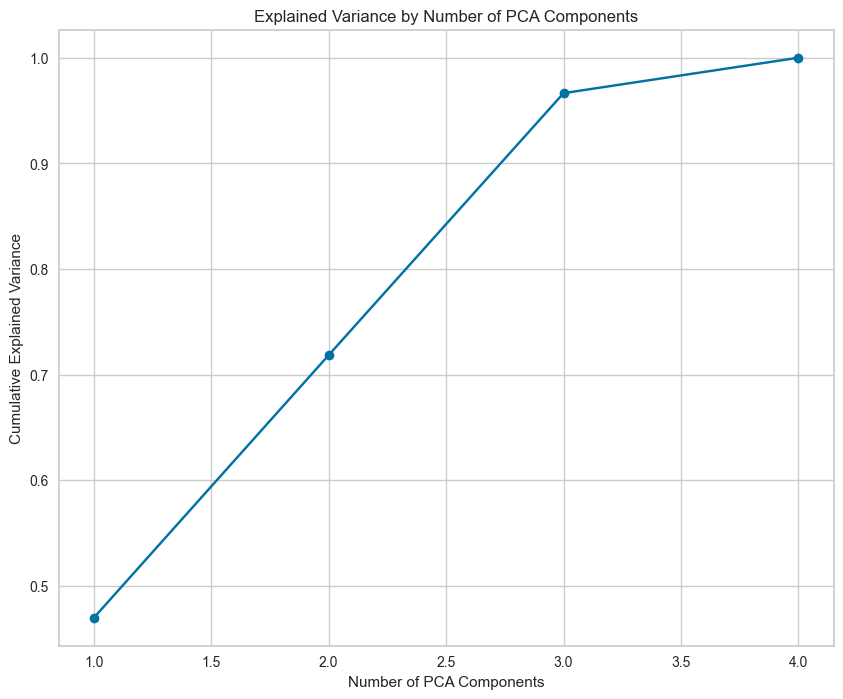

In [4]:
pca = PCA().fit(df_user_scaled)
plt.figure(figsize = (10,8))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_.cumsum(), marker = 'o')
plt.title('Explained Variance by Number of PCA Components')
plt.xlabel('Number of PCA Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

#### So when choosing n_components we have to decide how many of the components we want to keep vs how much of the variance we want.  It is a tradeoff of sorts.  You are looking at improving model performance at the cost of complexity.  So in this case you aren't just picking the 'best' (read n_components = 4) here.  You want to strike a balance that suits your needs.  Here I am looking to choose n_components = 2.  While I might lose out on some of the more complex relationships I could attain with n_components = 3, I gain on the efficiency of my modeling and the ease of use of my plotting.  Noise is reduced as well.  Overall it is a benefit that works for this project.

#### Now let's create a new variable for our n_components that we will use in our forthcoming models.

In [9]:
n_components = 2
pca_fit = PCA(n_components=n_components)
pca_features = pca_fit.fit_transform(df_user_scaled)

#### Great, now let's see how the newly-scaled features and component data look in a KMeans model, so we can see what clusters we can begin to extract for our customer data.

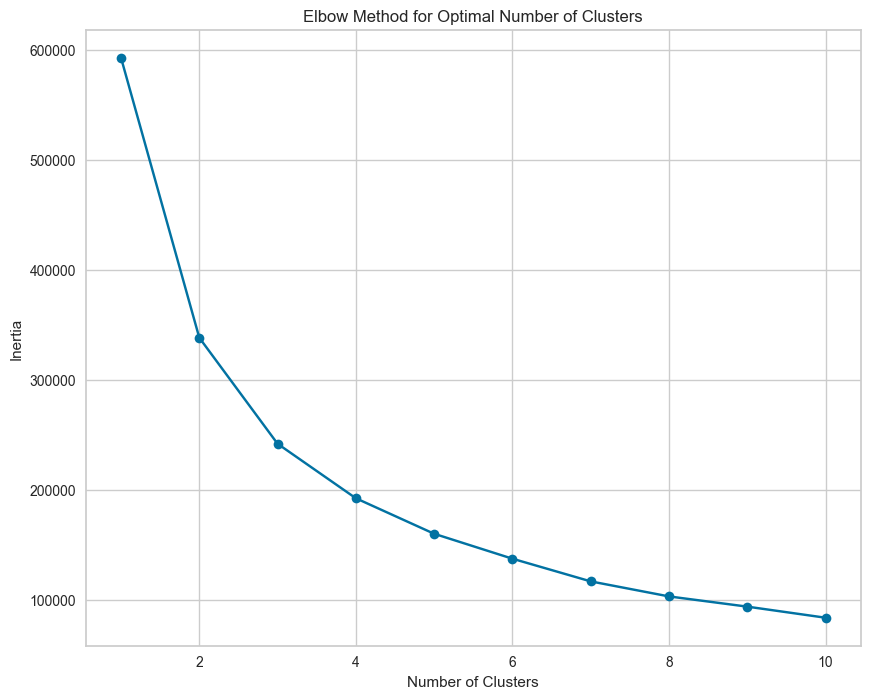

In [10]:
cust_list = []
for i in range(1,11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(pca_features)
    cust_list.append(kmeans.inertia_)

plt.figure(figsize = (10,8))
plt.plot(range(1,11), cust_list, marker = 'o')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()

#### Looks like at least from this elbow plot like the best k value is k=4 due to how the plot starts to 'flatten' or more specifically where the Inertia decreases more slowly at that point.  I will still observe a silhouette plot for this data just to confirm this k value so we can revise our Clustering models and more efficiently extract our customer clusters.

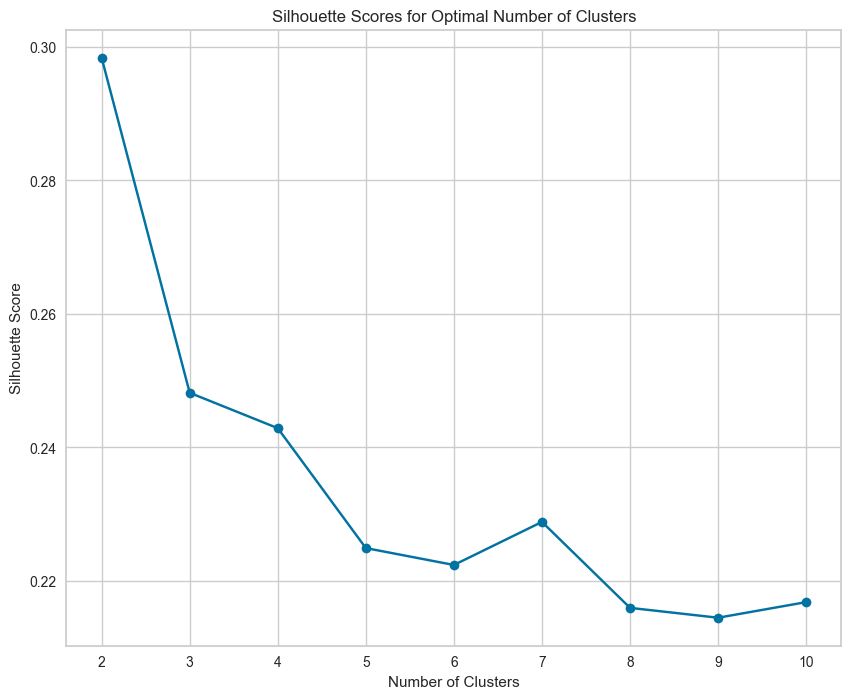

In [7]:
silhouette_scores = []

for i in range(2,11):
    kmeans = KMeans(n_clusters= i, random_state=42)
    cluster_labels = kmeans.fit_predict(pca_features)
    silhouette_avg = silhouette_score(pca_features, cluster_labels)
    silhouette_scores.append(silhouette_avg)

plt.figure(figsize = (10,8))
plt.plot(range(2,11), silhouette_scores, marker = 'o')
plt.title('Silhouette Scores for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()





#### Now that the scores have been obtained, let's plot each cluster to view them as well using the yellowbrick library and a silhouette analysis.  I will reduce the range needed to a max of 7, as I feel confident in our initial k=4 value to start.

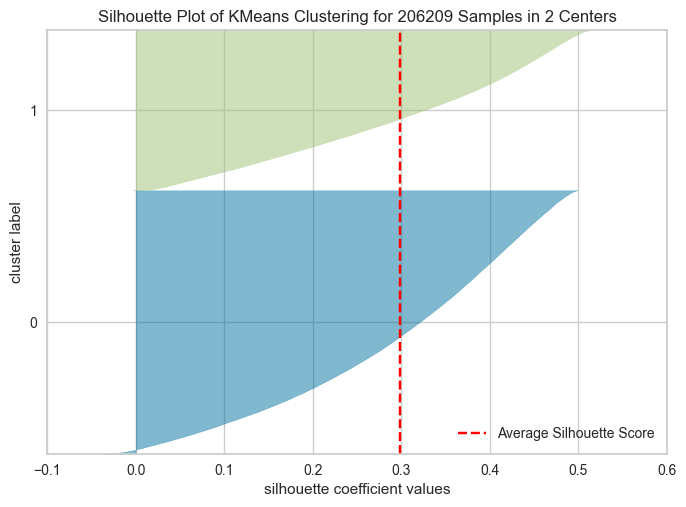

Silhouette score for n_clusters = 2: 0.29838575758992847


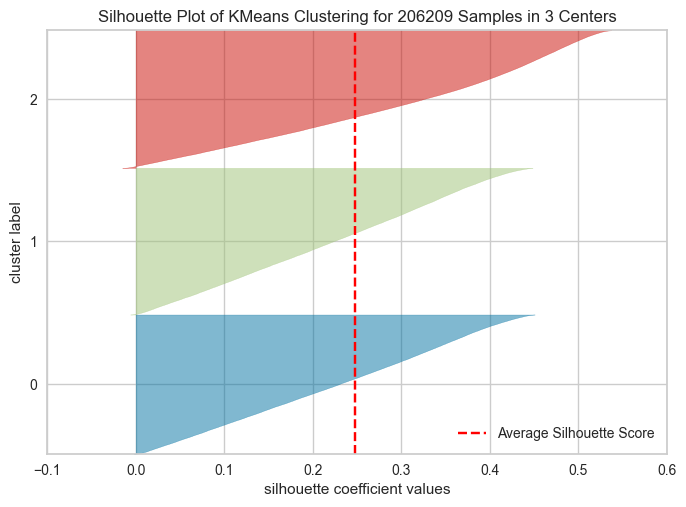

Silhouette score for n_clusters = 3: 0.24817206893113908


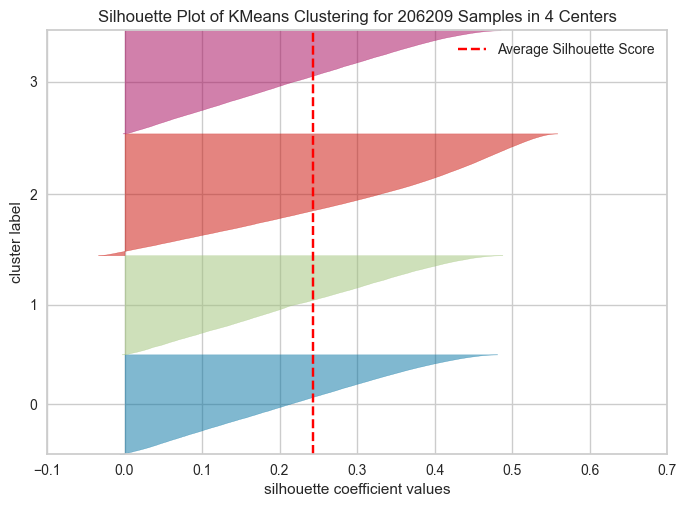

Silhouette score for n_clusters = 4: 0.2428678984412354


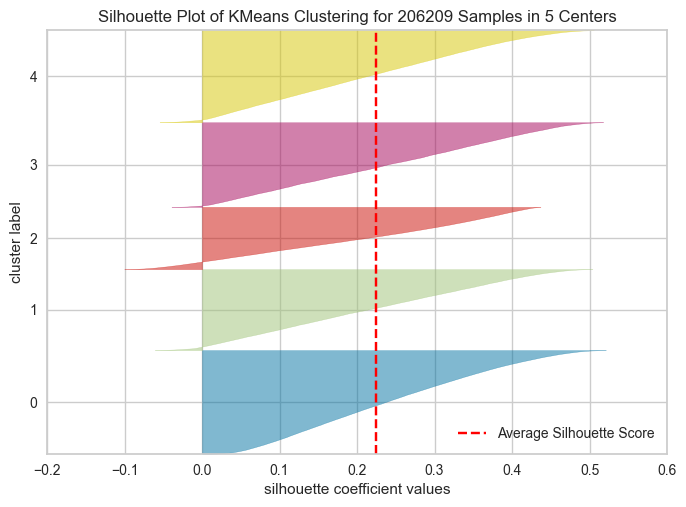

Silhouette score for n_clusters = 5: 0.22490056807112305


KeyboardInterrupt: 

In [8]:
silhouette_scores = []

for n_clusters in range(2,7):
    kmeans = KMeans(n_clusters = n_clusters, random_state = 42)
    visualizer = SilhouetteVisualizer(kmeans, colors = 'yellowbrick')
    visualizer.fit(pca_features)
    visualizer.show()

    cluster_labels = kmeans.predict(pca_features)
    silhouette_avg = silhouette_score(pca_features, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    print(f"Silhouette score for n_clusters = {n_clusters}: {silhouette_avg}")

plt.figure(figsize = (10,8))
plt.plot(range(2,7), silhouette_scores, marker = 'o')
plt.title('Silhouette Scores for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()


#### In observing our silhouette plots the results actually differ a bit from our previous plots.  The silhouette analysis shows our best k value to be k = 3.  Even though k = 4 is still a solid k value with a good silhouette score, k = 3 has a better score and noticeably less overlap in the clusters.  Also the size of each cluster (the width) is more consistent than with k = 4.  Going back to the previous plots too an argument can be made for k = 3 as a choice k value.  

#### Let's also observe a pairplot using our new optimal k value to see some potential relationships within these clusters.

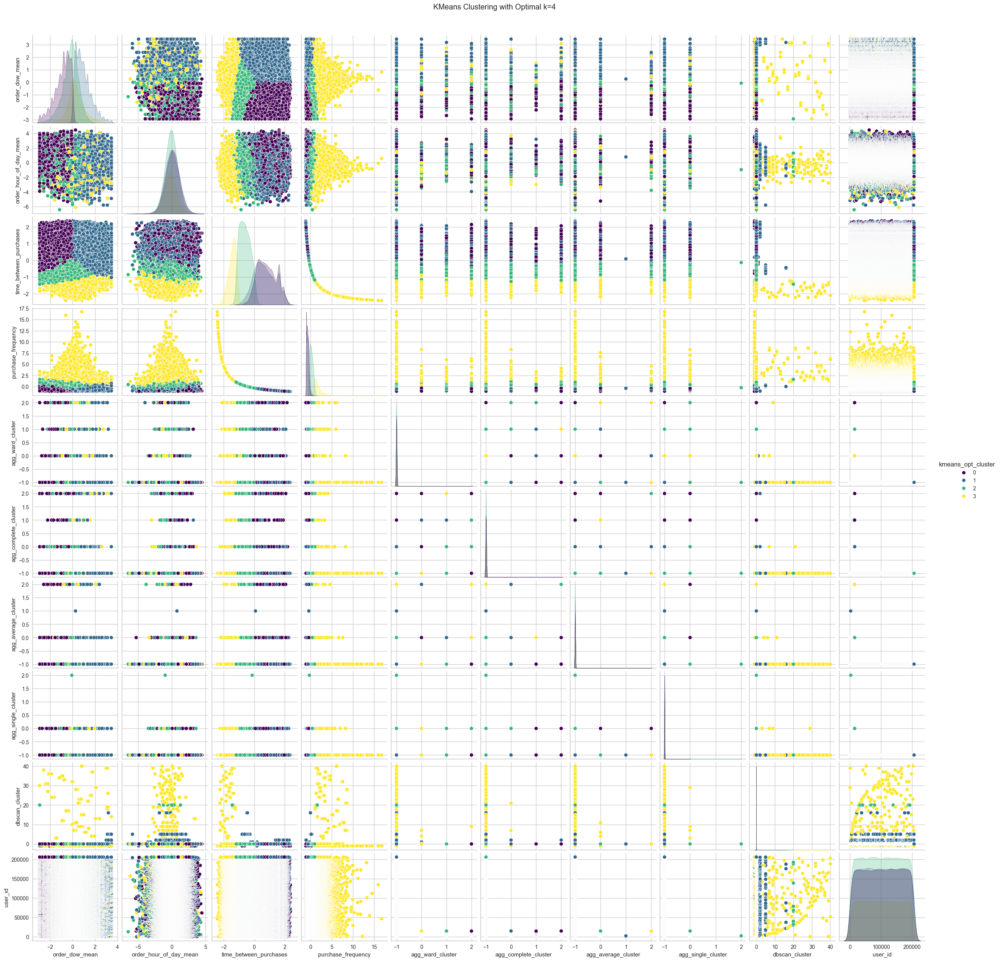

In [ ]:
optimal_k = 4

kmeans = KMeans(n_clusters = optimal_k, random_state = 42)
df_user_scaled['kmeans_opt_cluster'] = kmeans.fit_predict(pca_features)

sns.pairplot(df_user_scaled, hue = 'kmeans_opt_cluster', palette = 'viridis', diag_kind = 'kde')
plt.suptitle(f'KMeans Clustering with Optimal k={optimal_k}', y = 1.02)
plt.show()

#### Some clear and distinct observations can be made here based on the above pairplot.  When looking at the subplots identified between time_between_purchases and purchase_frequency, Cluster 2 (yellow) shows the least time between purchases as well as having the highest purchase frequency.  This would indicate that this user cluster would be our frequent or loyal customer base.  You can also see in the order_dow_mean vs time_between_purchases there is also noticeable separation in the clusters, with some observations being that Cluster 0 only purchases in the first half of the week while Cluster 1 seems to, on average, purchase during the second half of the week with both of the aforementioned Clusters having relatively the same amount of time in between purchases.    

#### Before we dive into plotting each cluster let's rerun our KMeans model with our optimal_k value of 3 and get a revised silhouette plot so we can reference it going forward for our cluster analysis.

Final Silhouette score for n_clusters = 3: 0.3521


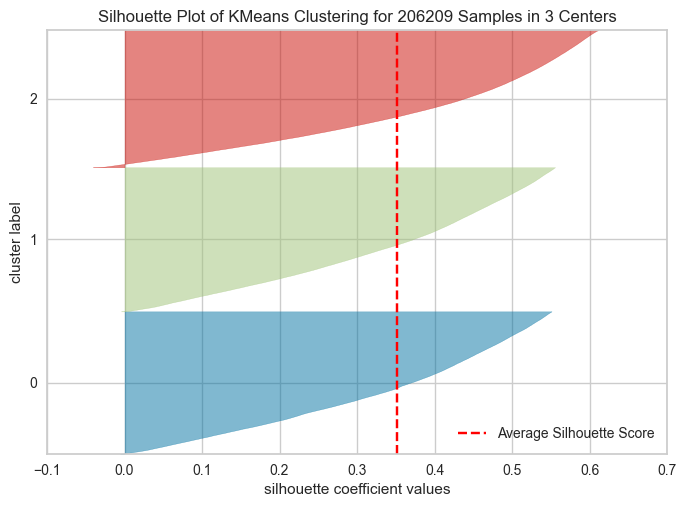

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 206209 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
cluster_labels = kmeans.fit_predict(pca_features)
silhouette_avg = silhouette_score(pca_features, cluster_labels)
print(f"Final Silhouette score for n_clusters = {optimal_k}: {silhouette_avg:.4f}")

visualizer = SilhouetteVisualizer(kmeans, colors = 'yellowbrick')
visualizer.fit(pca_features)
visualizer.show()

#### Great now let's plot each cluster relative to our main identifying features using histplots to learn even more about each cluster.

Cluster 0 Summary:
       order_dow_mean  order_hour_of_day_mean  time_between_purchases  \
count    55357.000000            55357.000000            55357.000000   
mean        -0.917268                0.157452                0.825590   
std          0.696560                1.034590                0.613653   
min         -2.924589               -5.331967               -1.032157   
25%         -1.331246               -0.532906                0.334847   
50%         -0.800132                0.154862                0.772866   
75%         -0.375241                0.827840                1.301377   
max          0.262096                4.460547                2.359974   

       purchase_frequency  kmeans_opt_cluster  agg_ward_cluster  \
count        55357.000000             55357.0      51644.000000   
mean            -0.676719                 0.0         -0.990667   
std              0.236566                 0.0          0.143639   
min             -1.101767                 0.0         -

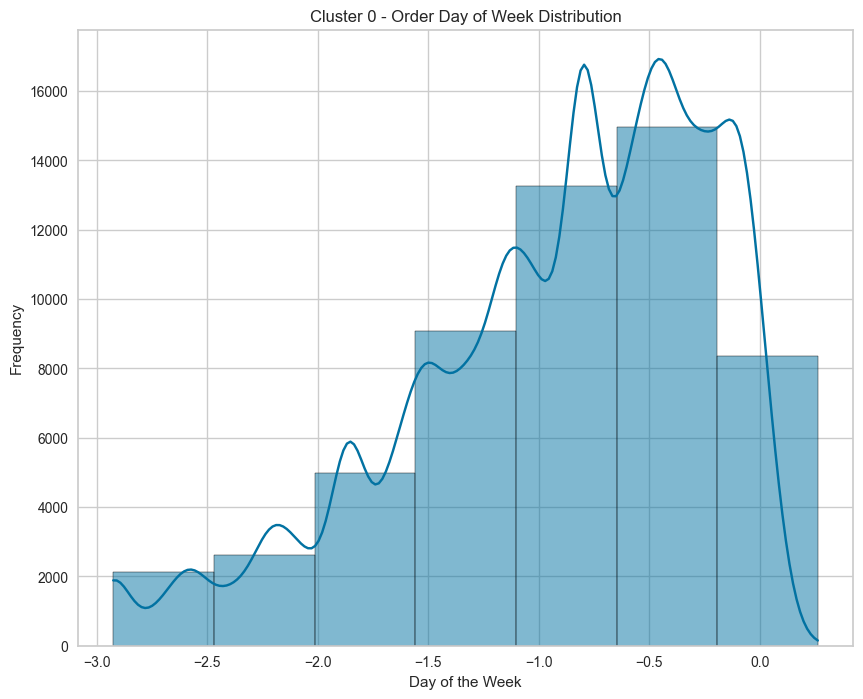

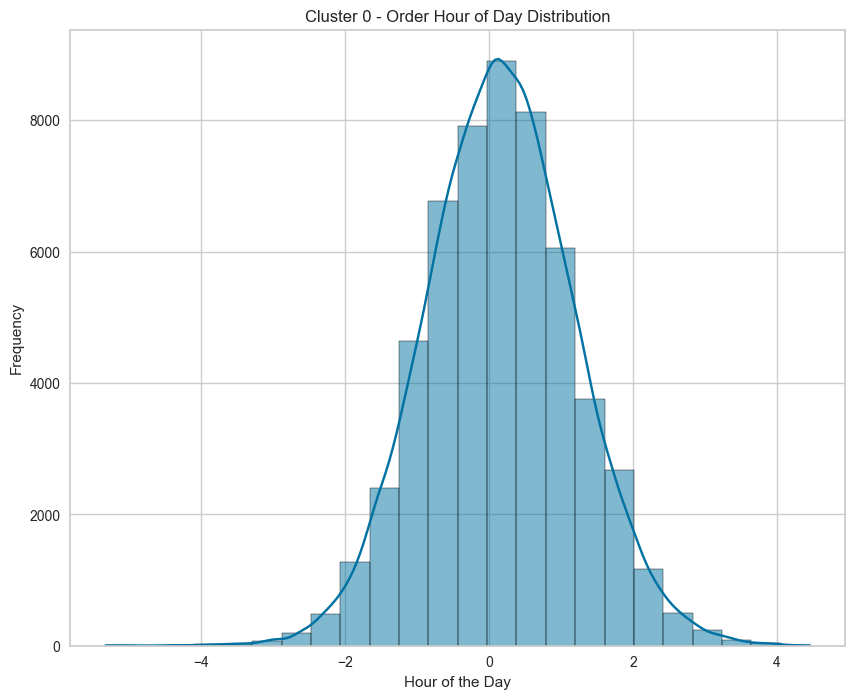

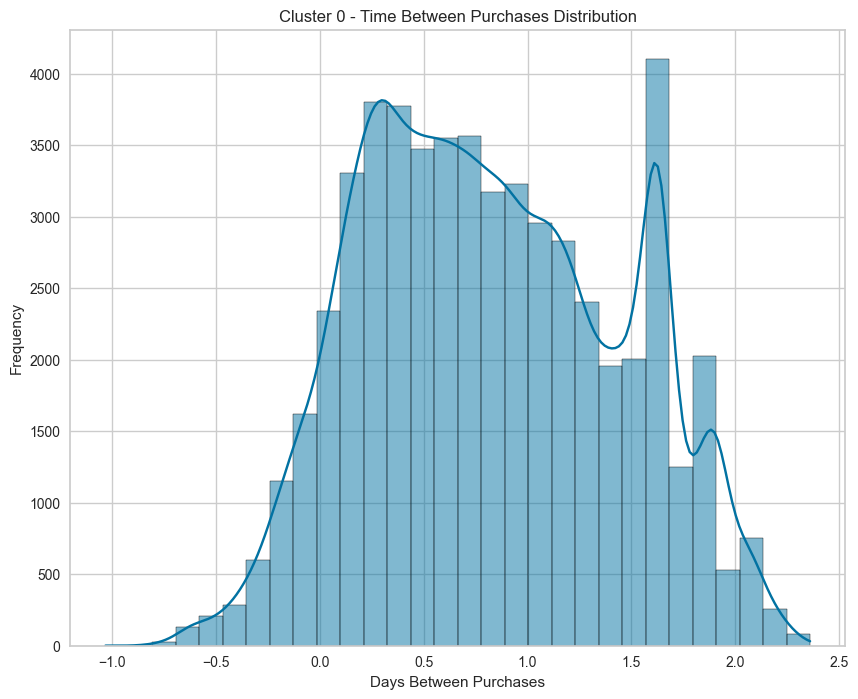

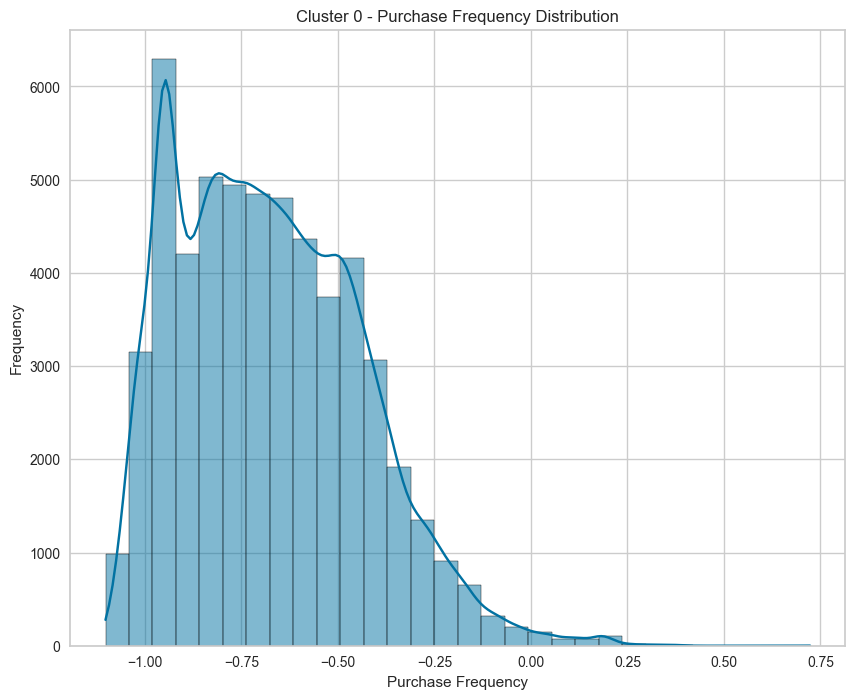

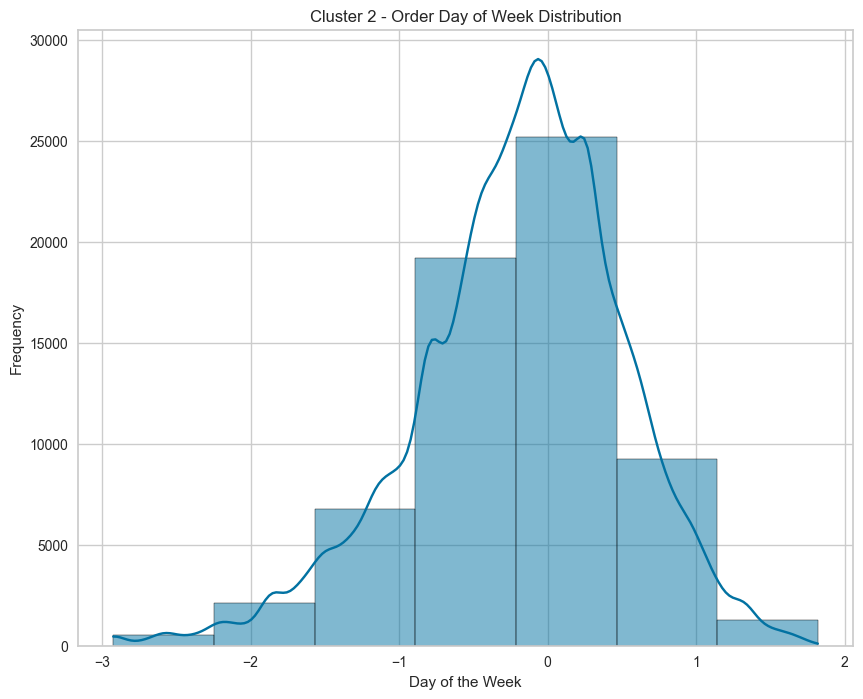

...

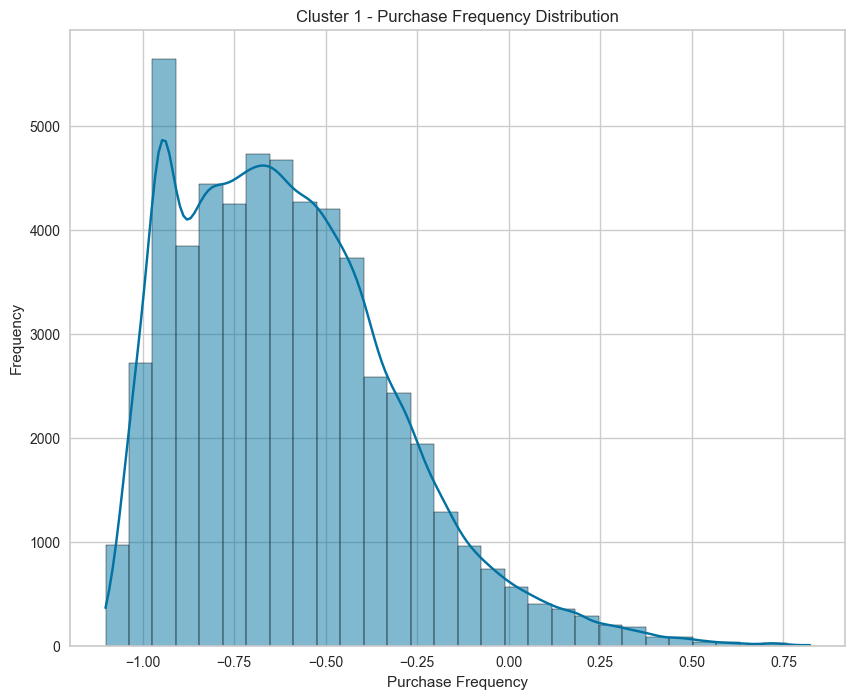

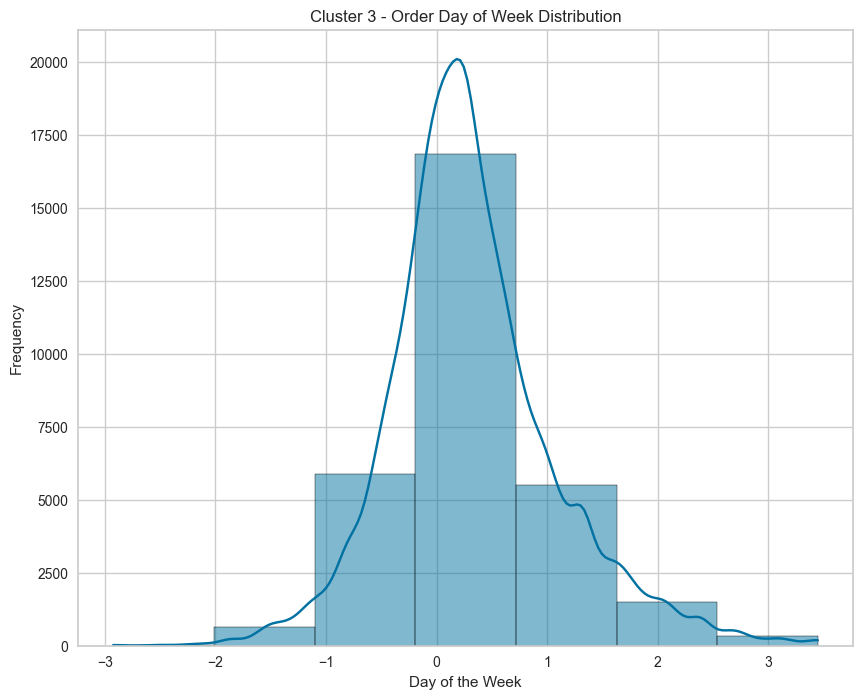

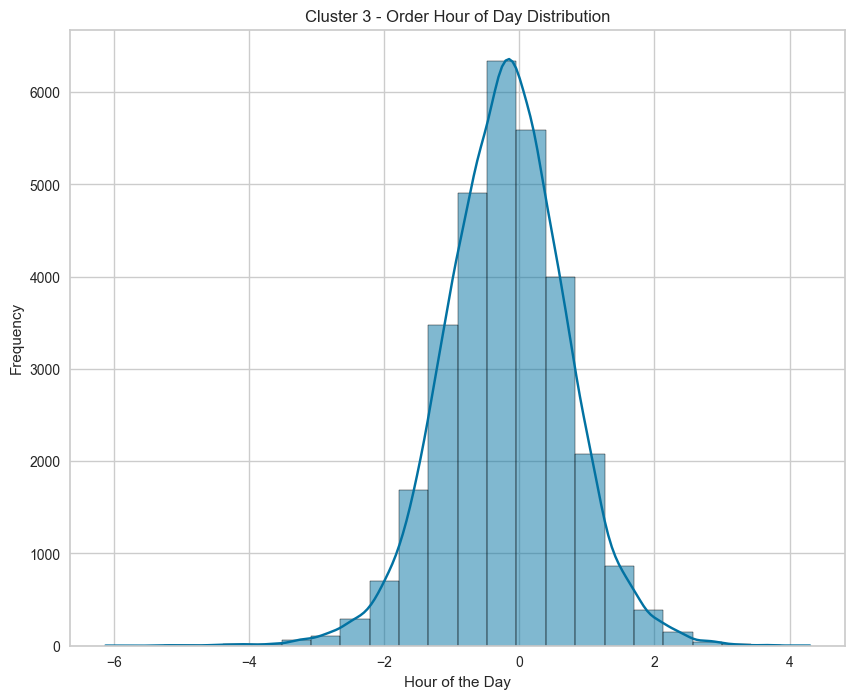

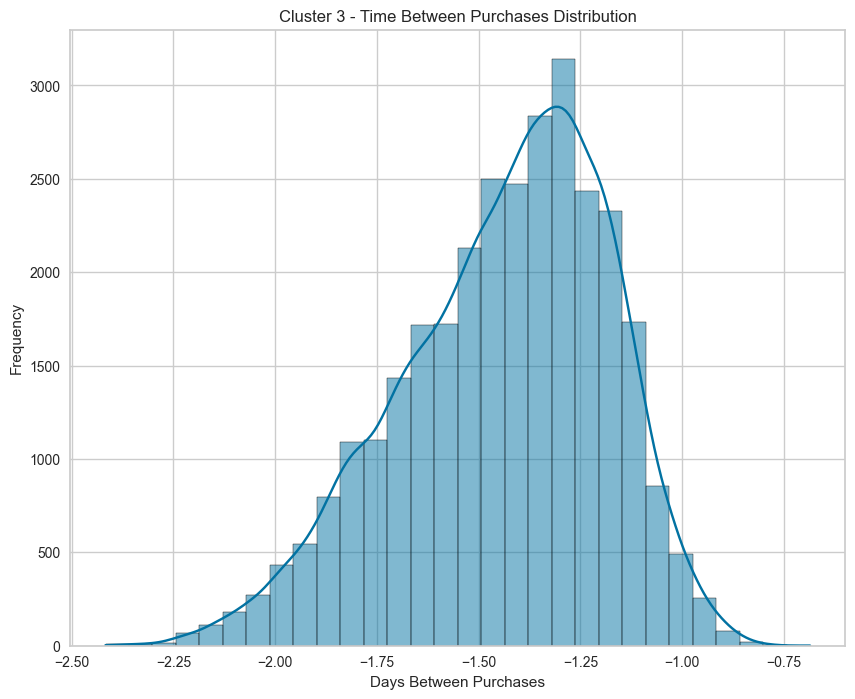

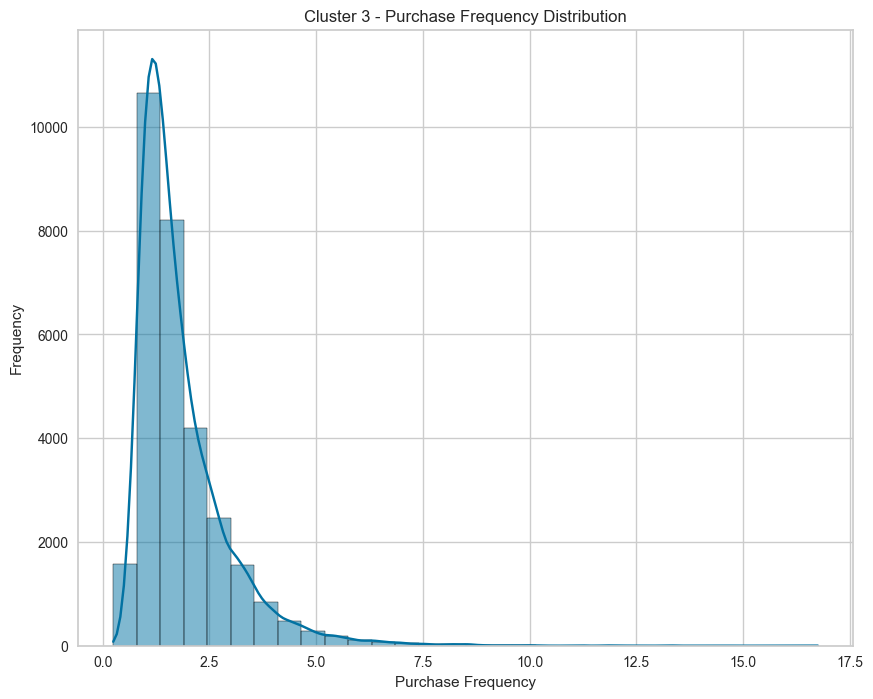

In [ ]:
for cluster in df_user_scaled['kmeans_opt_cluster'].unique():
    cluster_data = df_user_scaled[df_user_scaled['kmeans_opt_cluster'] == cluster]
    print(f'Cluster {cluster} Summary:')
    print(cluster_data.describe())

for cluster in df_user_scaled['kmeans_opt_cluster'].unique():
    cluster_data = df_user_scaled[df_user_scaled['kmeans_opt_cluster'] == cluster]
    plt.figure(figsize = (10,8))
    sns.histplot(cluster_data['order_dow_mean'], bins = 7, kde = True)
    plt.title(f"Cluster {cluster} - Order Day of Week Distribution")
    plt.xlabel("Day of the Week")
    plt.ylabel("Frequency")
    plt.show()
    
    plt.figure(figsize = (10,8))
    sns.histplot(cluster_data['order_hour_of_day_mean'], bins = 24, kde = True)
    plt.title(f"Cluster {cluster} - Order Hour of Day Distribution")
    plt.xlabel("Hour of the Day")
    plt.ylabel('Frequency')
    plt.show()
    
    plt.figure(figsize = (10,8))
    sns.histplot(cluster_data['time_between_purchases'], bins = 30, kde = True)
    plt.title(f"Cluster {cluster} - Time Between Purchases Distribution")
    plt.xlabel("Days Between Purchases")
    plt.ylabel("Frequency")
    plt.show()
    
    plt.figure(figsize = (10,8))
    sns.histplot(cluster_data['purchase_frequency'], bins = 30, kde = True)
    plt.title(f"Cluster {cluster} - Purchase Frequency Distribution")
    plt.xlabel("Purchase Frequency")
    plt.ylabel("Frequency")
    plt.show()




#### MKDN for Observations. . . 

#### Let's now get a count of how many customers are being represented in each one of these clusters (groups) using the KMeans clustering method.

In [ ]:
cluster_counts_kmeans = df_user_scaled['kmeans_opt_cluster'].value_counts()
print(cluster_counts_kmeans)

kmeans_opt_cluster
2    64376
1    55703
0    55357
3    30773
Name: count, dtype: int64


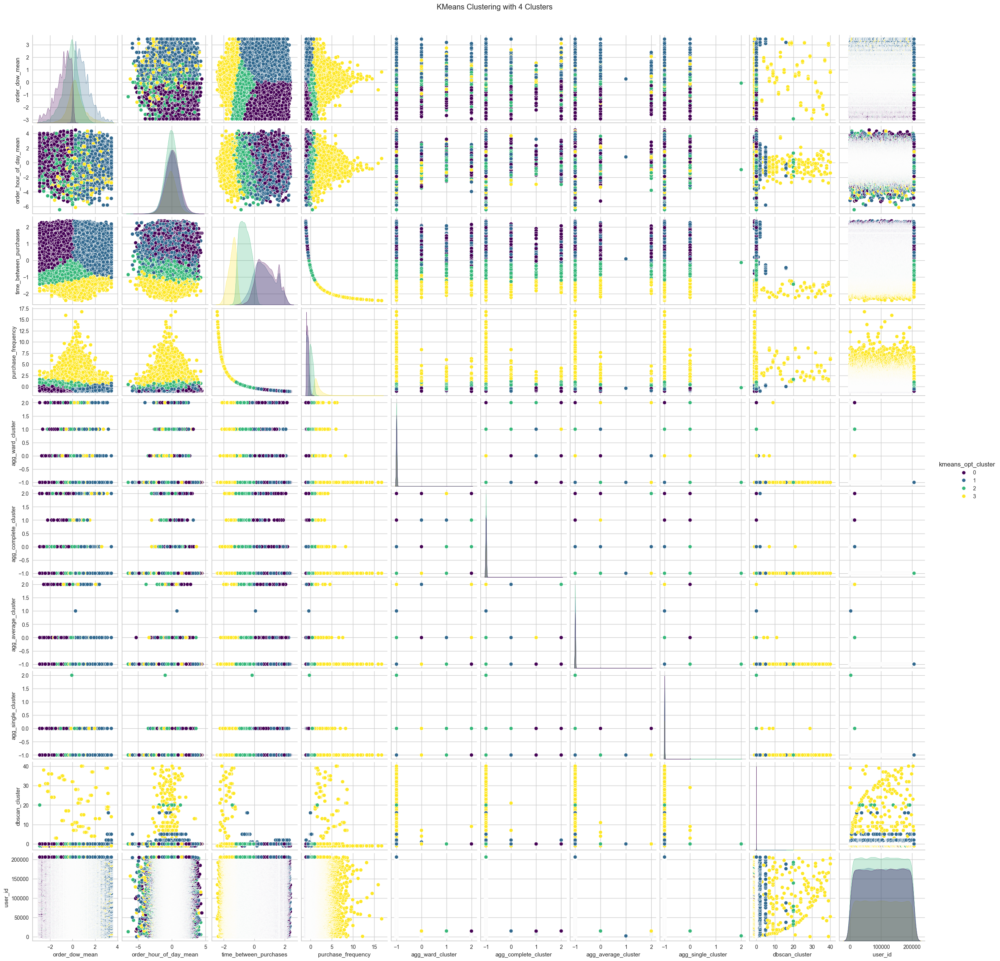

In [ ]:
sns.pairplot(df_user_scaled, hue='kmeans_opt_cluster', palette='viridis')
plt.suptitle('KMeans Clustering with 4 Clusters', y=1.02)
plt.show()

In [ ]:
for cluster in range(optimal_k):
    cluster_data = df_user_scaled[df_user_scaled['kmeans_opt_cluster'] == cluster]
    print(f"Cluster {cluster} Summary:")
    print(cluster_data.describe())

Cluster 0 Summary:
       order_dow_mean  order_hour_of_day_mean  time_between_purchases  \
count    55357.000000            55357.000000            55357.000000   
mean        -0.917268                0.157452                0.825590   
std          0.696560                1.034590                0.613653   
min         -2.924589               -5.331967               -1.032157   
25%         -1.331246               -0.532906                0.334847   
50%         -0.800132                0.154862                0.772866   
75%         -0.375241                0.827840                1.301377   
max          0.262096                4.460547                2.359974   

       purchase_frequency  kmeans_opt_cluster  agg_ward_cluster  \
count        55357.000000             55357.0      51644.000000   
mean            -0.676719                 0.0         -0.990667   
std              0.236566                 0.0          0.143639   
min             -1.101767                 0.0         -

#### Now let's use Agglomerative Clustering to verify our clusters as well as see how they look from a different angle.  I want to make sure there is no overlap with our users; we don't want them belonging to more than one cluster.  Since Agglomerative Clustering is quite memory-intensive I will be just sampling our data in order to allow this to run for us.

In [ ]:
def agg_clustering_mod_sample(linkage, data, df, cluster_col_name, sample_size = 15000):
    sample_indices = np.random.choice(len(data), size = sample_size, replace = False)
    sample_data = data[sample_indices]
    sample_df = df.iloc[sample_indices].reset_index(drop = True)
    
    agg = AgglomerativeClustering(n_clusters = optimal_k, linkage = linkage)
    sample_df[cluster_col_name] = agg.fit_predict(sample_data)
    df[cluster_col_name] = -1
    
    df.loc[sample_indices, cluster_col_name] = sample_df[cluster_col_name]
    
    return df, sample_data, sample_df

sample_size = 15000

df_user_scaled, pca_features_sampled_ward, df_user_scaled_sampled_ward = agg_clustering_mod_sample('ward', pca_features, df_user_scaled, 'agg_ward_cluster', sample_size = sample_size)
df_user_scaled, pca_features_sampled_complete, df_user_scaled_sampled_complete = agg_clustering_mod_sample('complete', pca_features, df_user_scaled, 'agg_complete_cluster', sample_size = sample_size)
df_user_scaled, pca_features_sampled_average, df_user_scaled_sampled_average = agg_clustering_mod_sample('average', pca_features, df_user_scaled, 'agg_average_cluster', sample_size = sample_size)
df_user_scaled, pca_features_sampled_single, df_user_scaled_sampled_single = agg_clustering_mod_sample('single', pca_features, df_user_scaled, 'agg_single_cluster', sample_size = sample_size)



#### Great now let's visualize our results by looking at more pairplots this time using our Agglomerative Clustering method to see how the relationships look here.

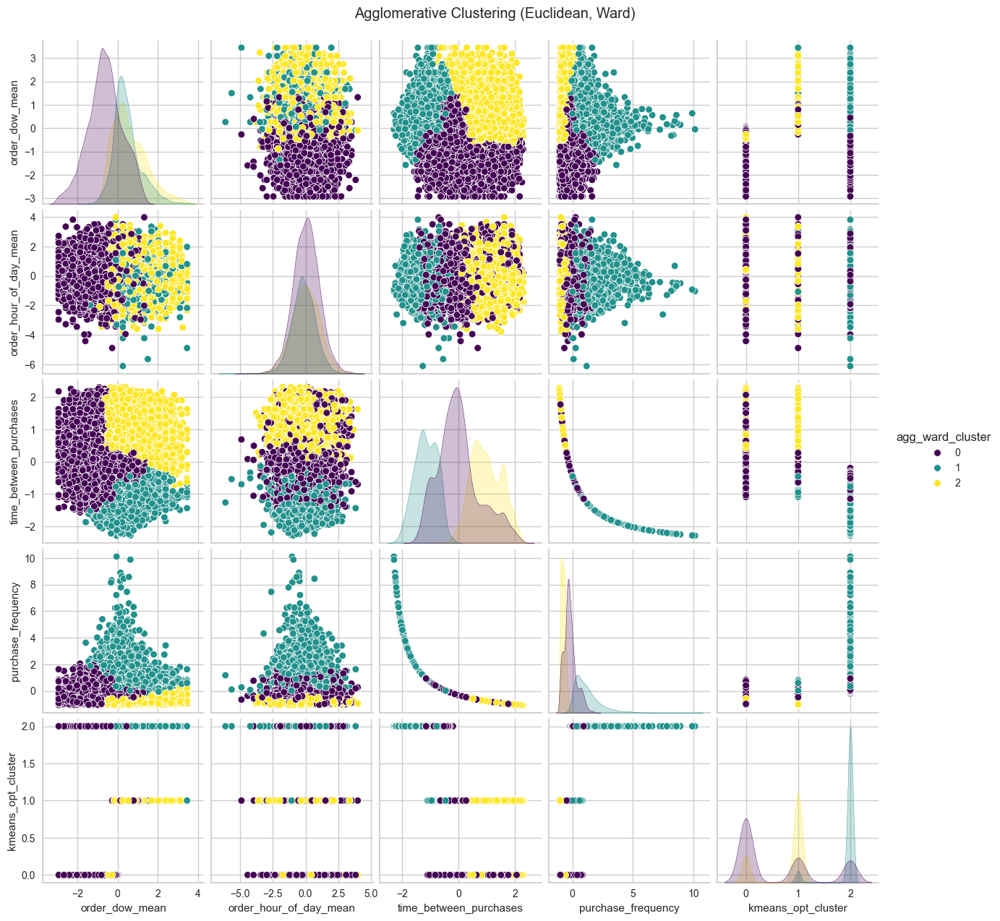

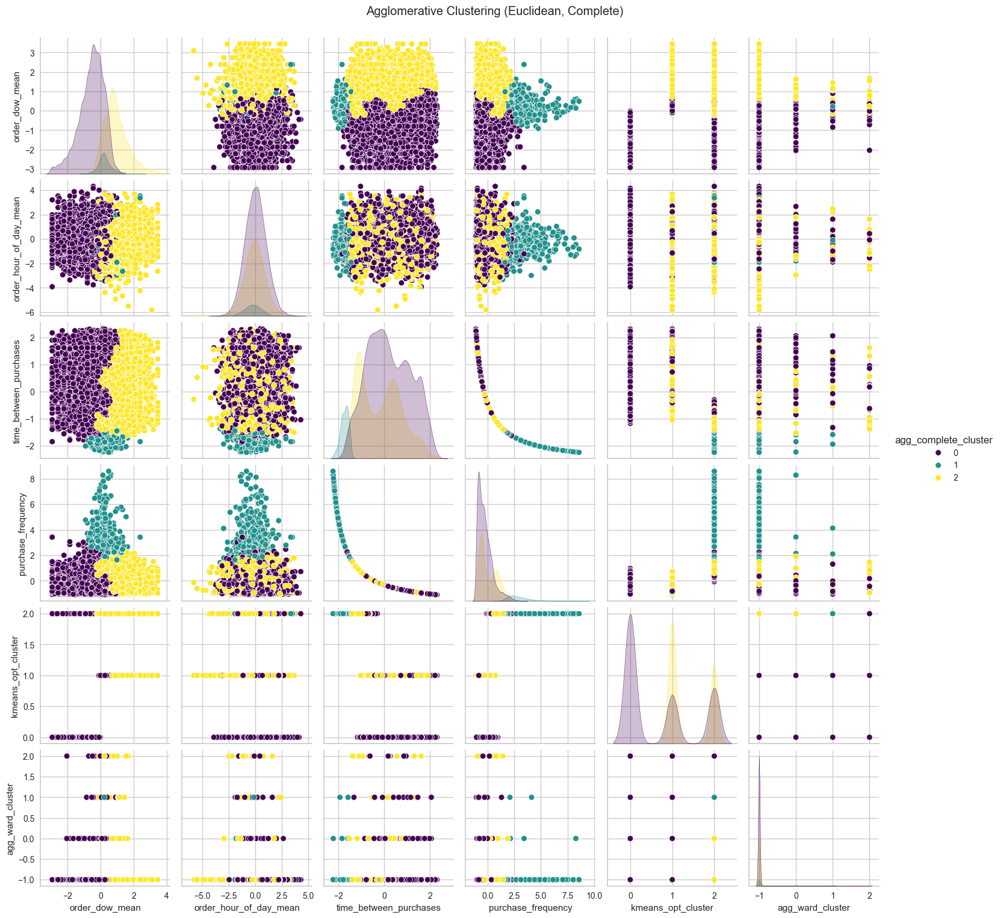

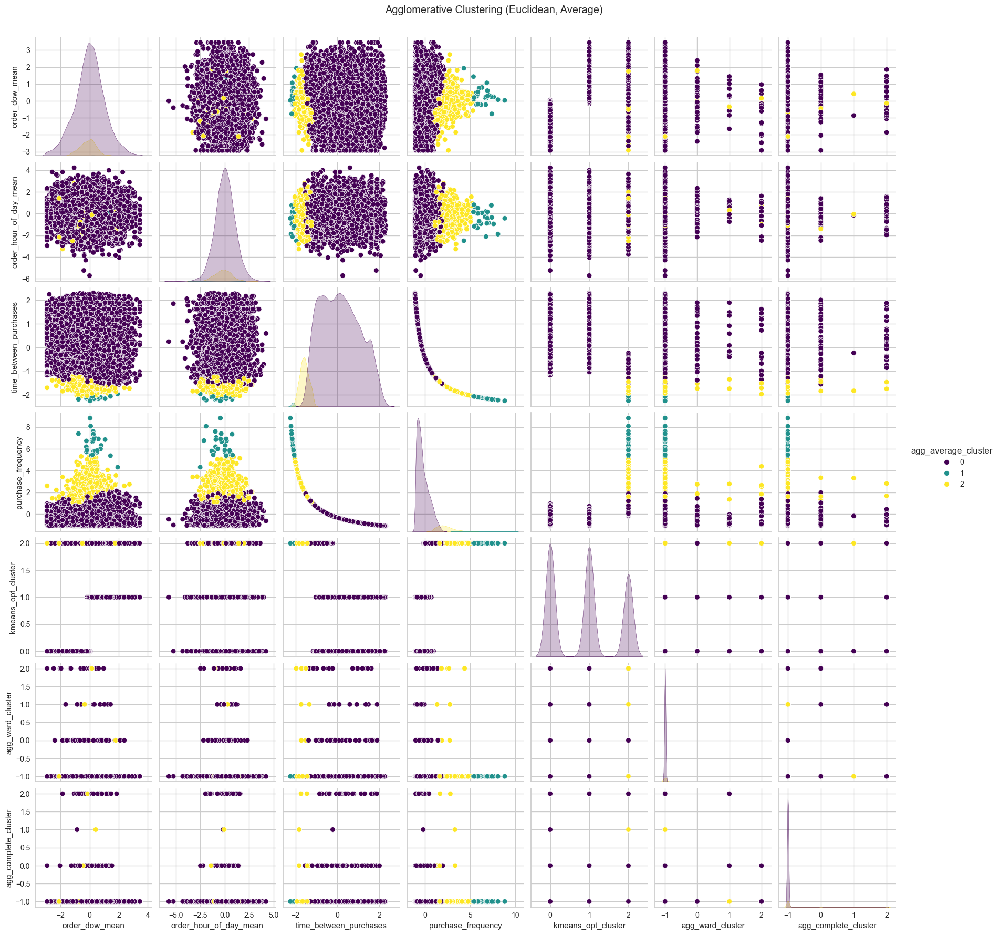

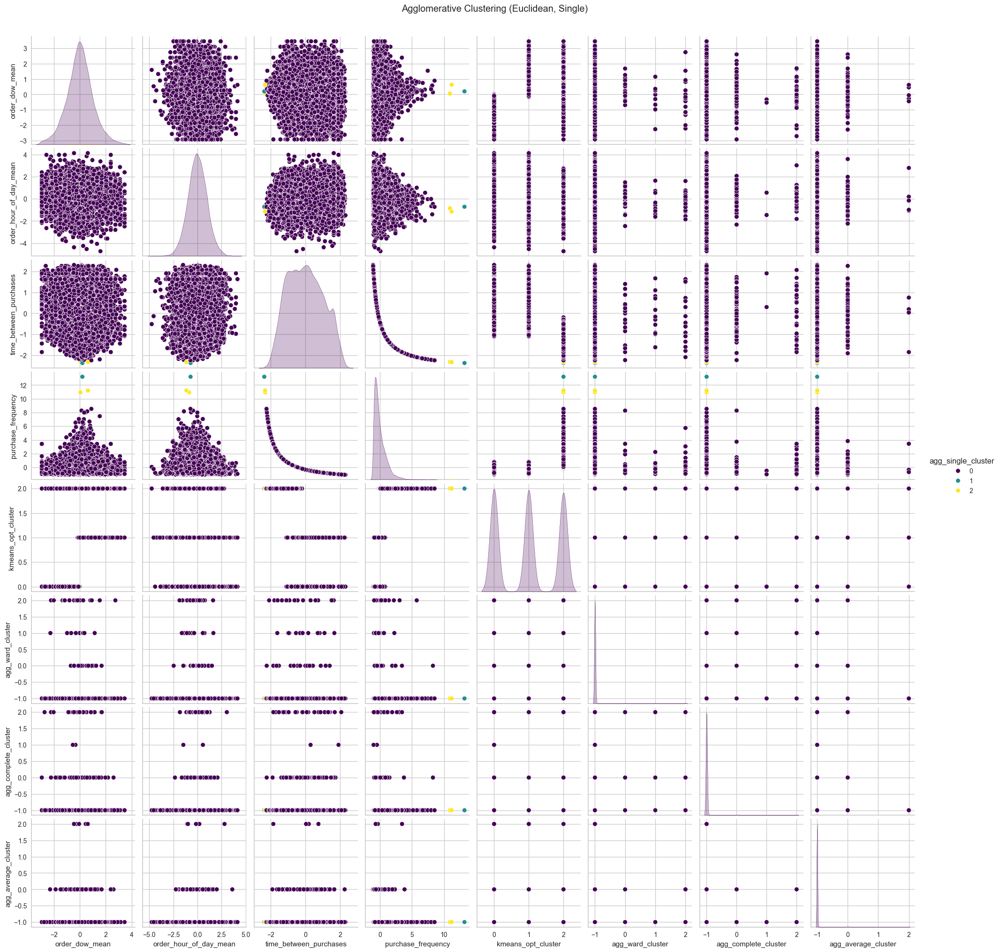

In [ ]:
sns.pairplot(df_user_scaled_sampled_ward, hue = 'agg_ward_cluster', palette = 'viridis', diag_kind= 'kde')
plt.suptitle('Agglomerative Clustering (Euclidean, Ward)', y = 1.02)
plt.show()

sns.pairplot(df_user_scaled_sampled_complete, hue = 'agg_complete_cluster', palette = 'viridis', diag_kind = 'kde')
plt.suptitle('Agglomerative Clustering (Euclidean, Complete)', y = 1.02)
plt.show()

sns.pairplot(df_user_scaled_sampled_average, hue = 'agg_average_cluster', palette = 'viridis', diag_kind= 'kde')
plt.suptitle('Agglomerative Clustering (Euclidean, Average)', y = 1.02)
plt.show()

sns.pairplot(df_user_scaled_sampled_single, hue = 'agg_single_cluster', palette = 'viridis', diag_kind = 'kde')
plt.suptitle('Agglomerative Clustering (Euclidean, Single)', y = 1.02)
plt.show()


#### MKDN for Observations. . .

#### Let's also create some histograms that look into the cluster sizes themselves.

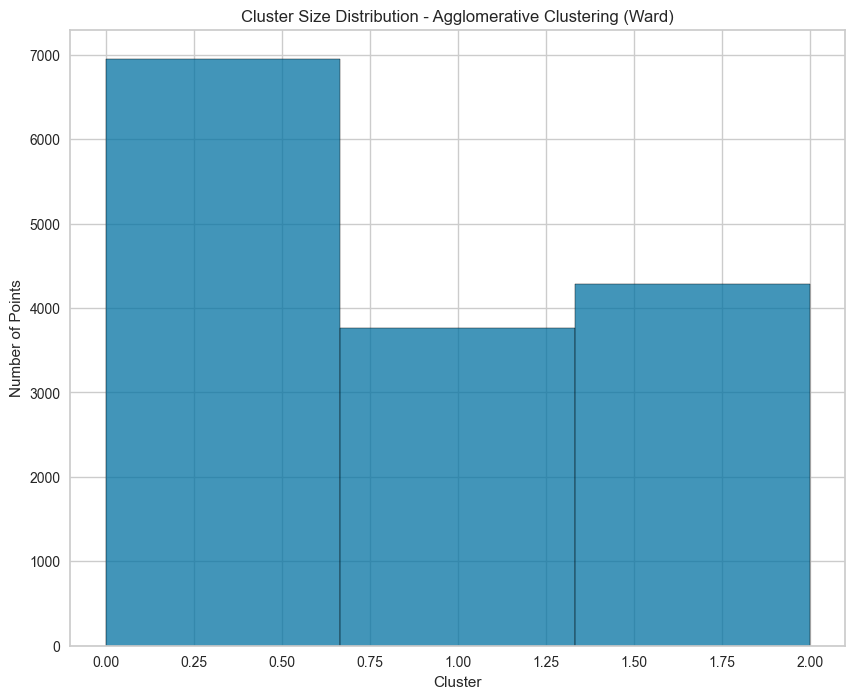

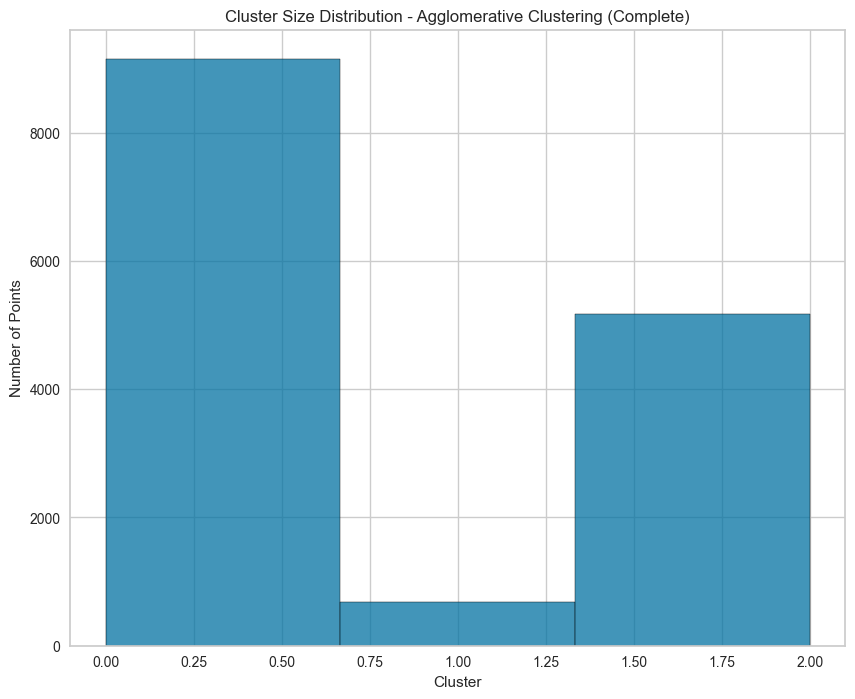

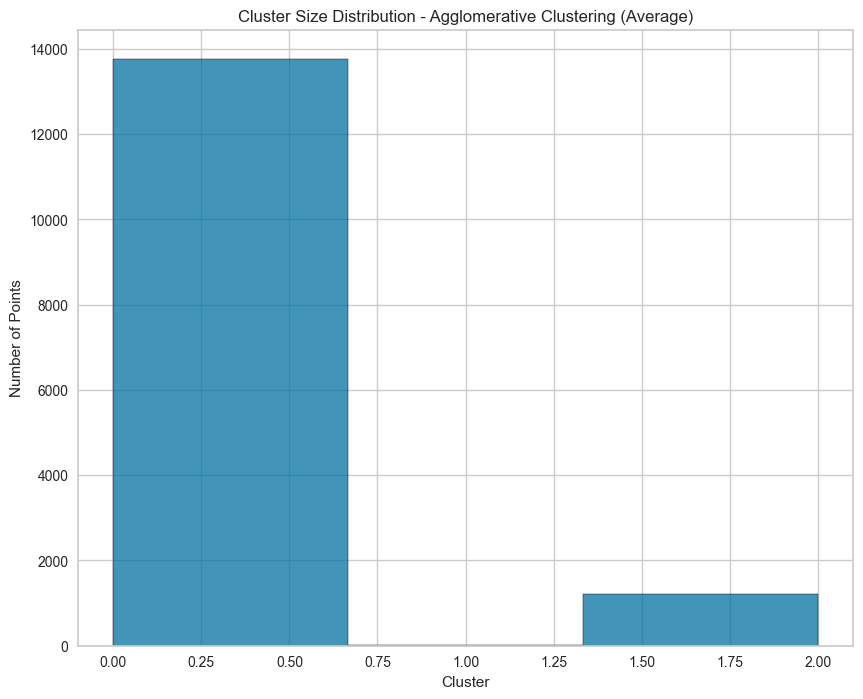

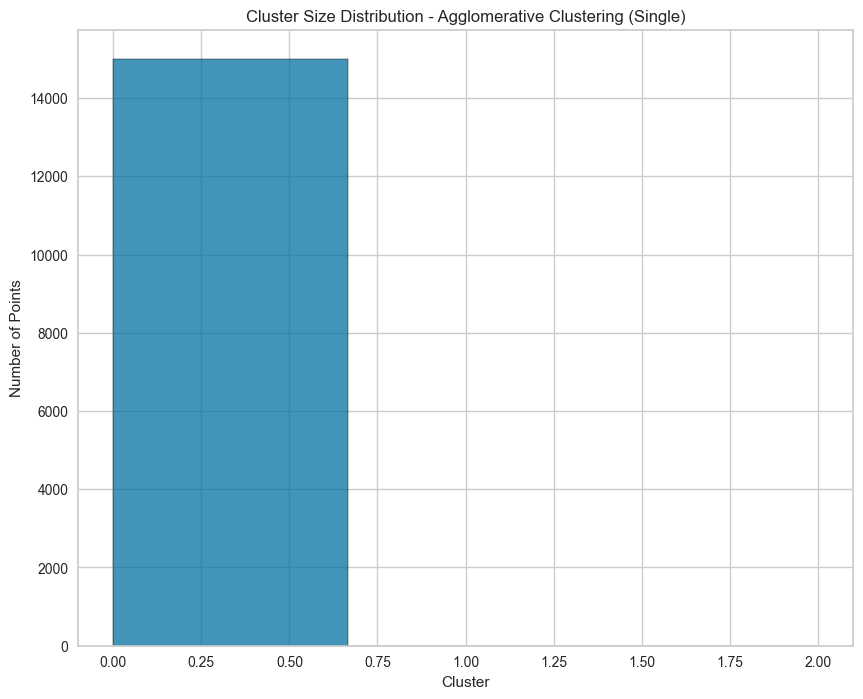

In [ ]:
def agg_histplot_cluster(cluster_labels, title):
    plt.figure(figsize = (10,8))
    sns.histplot(cluster_labels, bins = len(np.unique(cluster_labels)), kde = False)
    plt.title(f'Cluster Size Distribution - {title}')
    plt.xlabel('Cluster')
    plt.ylabel('Number of Points')
    plt.show()

agg_histplot_cluster(df_user_scaled_sampled_ward['agg_ward_cluster'], 'Agglomerative Clustering (Ward)')
agg_histplot_cluster(df_user_scaled_sampled_complete['agg_complete_cluster'], 'Agglomerative Clustering (Complete)')
agg_histplot_cluster(df_user_scaled_sampled_average['agg_average_cluster'], 'Agglomerative Clustering (Average)')
agg_histplot_cluster(df_user_scaled_sampled_single['agg_single_cluster'], 'Agglomerative Clustering (Single)')

#### In observing the histograms above we are looking for balance in our clusters, trying to get all three of our customer groups to be as close to the same size as possible.  Of the four Agglomerative Clustering methods we plotted only the first method (Ward) is close here, even though Cluster 0 has a noticeably higher cluster size than the other two.

#### The Ward method for Agglomerative had noticeable better clustering than the other three, so we will focus on that one for a second.  Let's get a count of each of the clusters.

In [ ]:
cluster_counts_agg_ward = df_user_scaled_sampled_ward['agg_ward_cluster'].value_counts()
print(cluster_counts_agg_ward)

agg_ward_cluster
0    6950
2    4285
1    3765
Name: count, dtype: int64


#### Now let's conduct a DBSCAN Clustering model to round off our foundation to establish our customer segmentation analysis.  We first will need to acquire two important parameters in the eps and n_components.  Conveniently one of them has been done for us when we did our PCA earlier.  We just need to get our eps value now before running our DBSCAN model.

In [ ]:
k = n_components + 1
neighbors = NearestNeighbors(n_neighbors = k)
neighbors_fit = neighbors.fit(pca_features)
distances, indices = neighbors_fit.kneighbors(pca_features)

distances = np.sort(distances[:, k - 1], axis = 0)

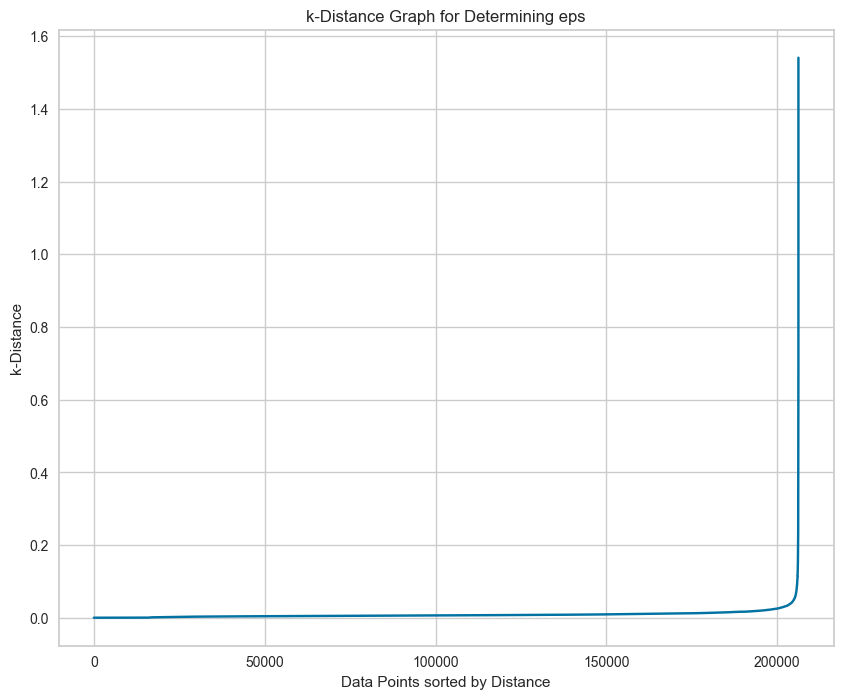

In [ ]:
plt.figure(figsize = (10,8))
plt.plot(distances)
plt.title('k-Distance Graph for Determining eps')
plt.xlabel('Data Points sorted by Distance')
plt.ylabel('k-Distance')
plt.grid(True)
plt.show()

In [ ]:
eps_value = 0.1

In [ ]:
dbscan = DBSCAN(eps = eps_value, min_samples=k)
df_user_scaled['dbscan_cluster'] = dbscan.fit_predict(pca_features)

outliers = df_user_scaled[df_user_scaled['dbscan_cluster'] == -1]
print("DBSCAN Outliers:\n", outliers)


DBSCAN Outliers:
         order_dow_mean  order_hour_of_day_mean  time_between_purchases  \
308          -0.417730               -0.941130               -2.233581   
898           1.324325                0.764663               -1.887017   
1023          0.347933               -0.990906               -2.343152   
1089          1.855439               -1.343887               -1.653086   
1567          2.740630               -0.119823               -1.725287   
...                ...                     ...                     ...   
204213        0.938060               -0.514682               -2.239882   
204224        3.448782               -3.594586                0.180819   
204554        3.448782               -2.765381               -1.393162   
205882        2.622605                0.354009               -1.494244   
206104        0.208449                0.502380               -2.201375   

        purchase_frequency  kmeans_opt_cluster  agg_ward_cluster  \
308               8.50824

#### As we have done before let's plot our results to see how this clustering method compares to the others we have seen.  Let's start with pairplots.

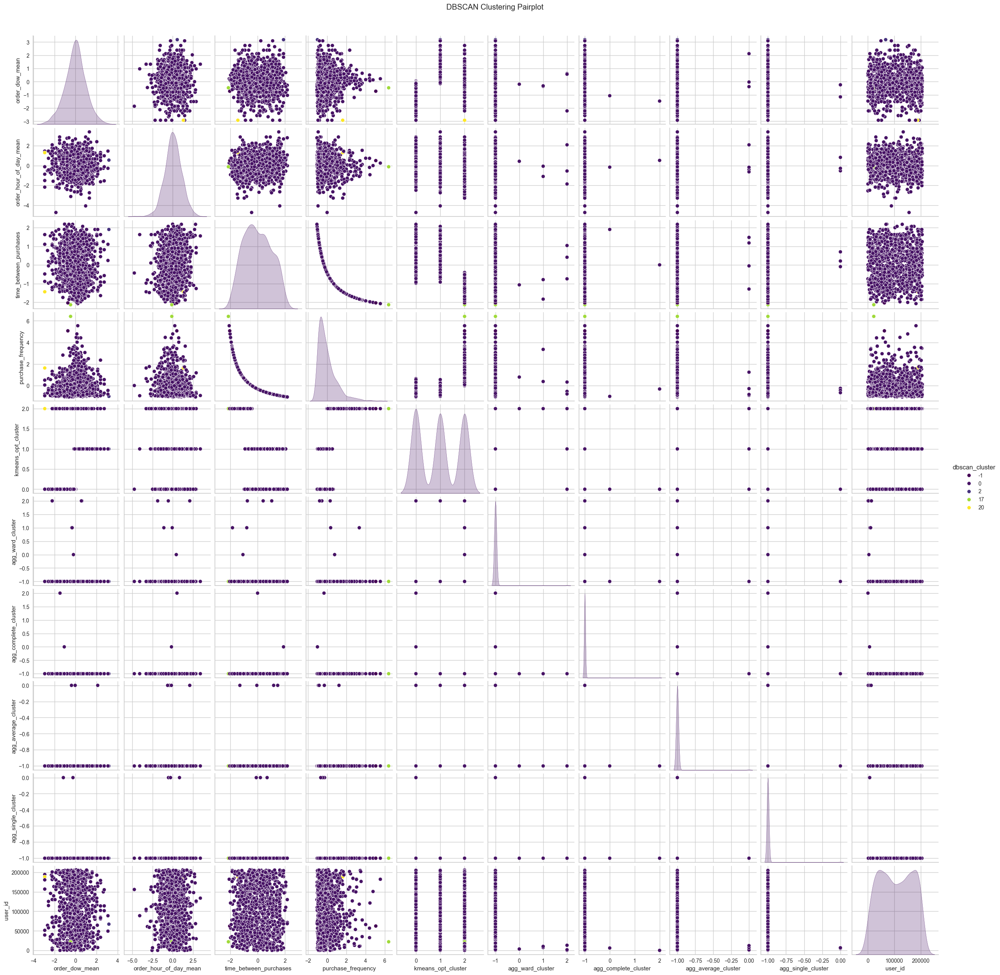

In [ ]:

df_user_scaled['dbscan_cluster'] = dbscan.labels_

sampled_df = df_user_scaled.sample(n = 1000, random_state = 42)

sns.pairplot(sampled_df, hue = 'dbscan_cluster', palette = 'viridis', diag_kind = 'kde')
plt.suptitle('DBSCAN Clustering Pairplot', y = 1.02)
plt.show()






In [ ]:
cluster_counts_db = df_user_scaled['dbscan_cluster'].value_counts()
print(cluster_counts_db)

dbscan_cluster
 0     205634
-1        253
 2         80
 5         34
 1         30
 9         22
 7         13
 11        10
 20         9
 19         6
 24         6
 16         6
 28         5
 23         5
 14         5
 6          5
 36         4
 27         4
 30         4
 31         4
 33         4
 35         4
 15         4
 21         4
 18         3
 34         3
 37         3
 29         3
 32         3
 39         3
 3          3
 4          3
 26         3
 40         3
 8          3
 25         3
 10         3
 38         3
 12         3
 22         3
 13         3
 17         3
Name: count, dtype: int64


#### We will now define 6 different clustering solutions for our segmentation part of the project, and plot them all out to see how they are alike and differ.  We will also be mapping back in the user_id feature to see which could be the most optimal choice for our project solution.

In [ ]:
df_user_scaled['user_id'] = user_behavior['user_id']

user_behavior = user_behavior.merge(df_user_scaled[['user_id', 'kmeans_opt_cluster']], on='user_id', how = 'left')

combined_clusters = df_user_scaled[['user_id', 'kmeans_opt_cluster', 'agg_ward_cluster', 'agg_ward_complete', 'agg_ward_average', 'agg_ward_single', 'dbscan_cluster']]

cluster_mapping_kmeans = user_behavior[['user_id', 'kmeans_opt_cluster']]
cluster_mapping_agglo_ward = user_behavior[['user_id', 'agg_ward_cluster']]
cluster_mapping_agglo_complete = user_behavior[['user_id', 'agg_ward_complete']]
cluster_mapping_agglo_average = user_behavior[['user_id', 'agg_ward_average']]
cluster_mapping_agglo_single = user_behavior[['user_id', 'agg_ward_single']]
cluster_mapping_dbscan = user_behavior[['user_id', 'dbscan_cluster']]

print(combined_clusters.head())

KeyError: "['agg_ward_complete', 'agg_ward_average', 'agg_ward_single'] not in index"

NameError: name 'combined_clusters' is not defined

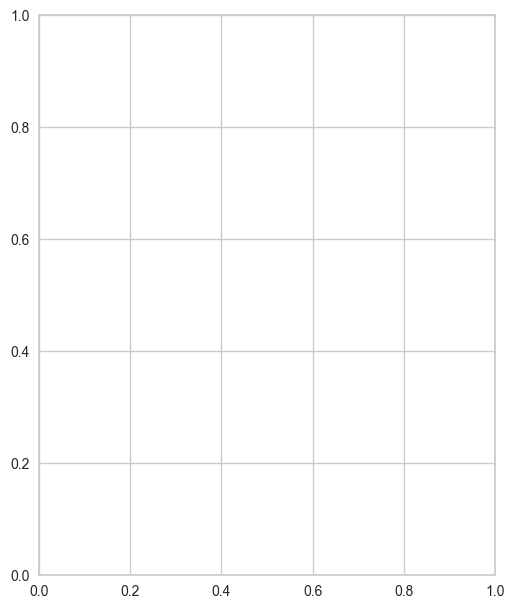

In [ ]:
plt.figure(figsize = (20, 16))
plt.subplot(2, 3, 1)
sns.scatterplot(x = pca_features[:,0], y = pca_features[:,1], hue = combined_clusters['kmeans_opt_cluster'], palette = 'viridis', legend = 'full')
plt.title('KMeans Clustering')

plt.subplot(2,3,2)
sns.scatterplot(x = pca_features[:,0], y = pca_features[:,1], hue = combined_clusters['agg_ward_cluster'], palette = 'viridis', legend = 'full')
plt.title('Agglomerative Clustering (Ward Linkage)')

plt.subplot(2,3,3)
sns.scatterplot(x = pca_features[:,0], y = pca_features[:,1], hue = combined_clusters['agg_ward_complete'], palette = 'viridis', legend = 'full')
plt.title('Agglomerative Clustering (Complete Linkage)')

plt.subplot(2,3,4)
sns.scatterplot(x = pca_features[:,0], y = pca_features[:,1], hue = combined_clusters['agg_ward_average'], palette = 'viridis', legend = 'full')
plt.title('Agglomerative Clustering (Average Linkage)')

plt.subplot(2,3,5)
sns.scatterplot(x = pca_features[:,0], y = pca_features[:,1], hue = combined_clusters['agg_ward_single'], palette = 'viridis', legend = 'full')
plt.title('Agglomerative Clustering (Single Linkage)')

plt.subplot(2,3,6)
sns.scatterplot(x = pca_features[:,0], y = pca_features[:,1], hue = combined_clusters['dbscan_cluster'], palette = 'viridis', legend = 'full')
plt.title('DBSCAN Clustering')
plt.tight_layout()

plt.show()

#### As we have done before let's save our work so we can keep using in the next notebook(s).

In [ ]:
main_path = r'C:/Users/ryanm/Desktop/df-scaled.csv'

df_user_scaled.to_csv(main_path, index = False)


